In [2]:
%pip install opencv-python
from pathlib import Path
from PIL import Image
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np
import matplotlib.pyplot as plt
import cv2
import pandas as pd
from sklearn.manifold import TSNE

Note: you may need to restart the kernel to use updated packages.


In [13]:
%pip install kmedoids

Note: you may need to restart the kernel to use updated packages.


In [14]:
import kmedoids

**Abrir las imagenes**

In [3]:
def cargar_imagen(image_dir):
    
    image_paths = sorted(
        path for path in image_dir.glob("*")
        if path.is_file()
    )
    print(f"Cant. de imagenes: {len(image_paths)}")
    return image_paths

**Conocer las imagenes**


In [4]:
def tamano_original(image_paths):
    
    for path in image_paths:
        if path.is_file():
            image = cv2.imread(str(path))
            height, width = image.shape[:2]
            print(f"{path.name}: tamaño={width} × {height}")

**Transformacion RGB**

Se incorporó la conversión de BGR a RGB debido a que cv2.imread() carga las imágenes en formato BGR. Esto garantiza una representación RGB consistente antes de realizar el redimensionamiento y la extracción de la paleta mediante K-Means.

In [5]:
def convert_to_rgb(image):
    
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image_rgb

**Redimensionamiento de las imágenes**

Las imágenes seleccionadas tienen dimensiones variables, por ejemplo, `3300 × 1382` y `1382 × 1629`. Por esta razón, se realizará un proceso de redimensionamiento (*resize*) antes de utilizarlas en el modelo.

No se utilizará un tamaño fijo para todas las imágenes, ya que esto podría cambiar su relación de aspecto y generar deformaciones. En su lugar, se establecerá un tamaño máximo y cada imagen se redimensionará manteniendo su proporción original.

El objetivo del redimensionamiento es **reducir el número de píxeles que debe procesar K-Means**, haciendo que el algoritmo sea más rápido y requiera menos recursos, pero conservando la información de color de las obras.

Aunque en este ejercicio se trabaja con un número reducido de imágenes, algunas de ellas tienen millones de píxeles. Además, el pipeline debe estar preparado para recibir imágenes nuevas que podrían tener una resolución mucho mayor. Por esta razón, se incluye el redimensionamiento como parte del preprocesamiento, buscando reducir el costo computacional sin perder información relevante para la extracción de la paleta de colores.



**Decisión sobre el factor de reducción**


En lugar de establecer un tamaño fijo para todas las imágenes, se decidió evaluar diferentes **factores de reducción**. Esta decisión permite mantener la proporción original de cada imagen y, al mismo tiempo, analizar cómo la reducción del número de píxeles afecta la información de color y el costo computacional del procesamiento con K-Means. Se probarán los factores **1/2, 1/4, 1/8, 1/16 y 1/32**, donde cada factor se aplica tanto al ancho como al alto de la imagen. De esta forma, la selección del factor final no se realizará de manera arbitraria, sino a partir de la comparación de los resultados obtenidos en términos de conservación de la información y eficiencia computacional.


In [6]:
## Definir la funcion para 
## Calcular los nuevos tama;os segun el factor para redimensionar.
## Redimensionar usando el metodo del area

RESIZE_FACTORS = [1, 1/2, 1/3, 1/4, 1/8, 1/16, 1/32]

def resize_area(image, factor):
    
    height, width = image.shape[:2]
    new_width = int(width * factor)
    new_height = int(height * factor)
    resized = cv2.resize(
        image,
        (new_width, new_height),
        interpolation=cv2.INTER_AREA
    )
    return resized

Se incluye el factor 1, correspondiente a la imagen original sin reducción, como referencia para evaluar el efecto de los distintos niveles de redimensionamiento. De esta manera, las paletas obtenidas a partir de cada tamaño reducido pueden compararse con la paleta de la imagen original y determinar qué factor permite reducir el número de píxeles manteniendo una representación de color suficientemente similar.

**Reshape y normalizacion**

Posteriormente, las imágenes se transforman mediante un reshape para representar cada píxel como una observación independiente con tres componentes RGB. Finalmente, los valores de los píxeles se normalizan al rango [0,1], dejando los datos en una estructura adecuada para aplicar K-Means.

In [7]:
def flatten_and_normalize(image):

    image = image.reshape((-1, 3))
    image = image / 255.0
    return image

### Pipeline Preprocesamiento

In [8]:
def preprocesamiento(image_paths, resize_factors):

    processed_images = []

    for path in image_paths:

        # Cargar imagen
        image = cv2.imread(str(path))

        # Convertir a RGB
        image = convert_to_rgb(image)

        # Aplicar cada factor de reducción
        for factor in resize_factors:

            # Resize con AREA
            resized = resize_area(image, factor)

            # Reshape y normalización
            processed = flatten_and_normalize(resized)

            processed_images.append({
                "path": path,
                "factor": factor,
                "image": processed,
                "shape": resized.shape,
                "resized": resized
            })

    return processed_images

**Preparacion de las imagenes**

In [9]:
IMAGE_DIR = Path("data/images")

image_paths = cargar_imagen(IMAGE_DIR)

processed_images = preprocesamiento(
    image_paths,
    RESIZE_FACTORS
)

Cant. de imagenes: 10


**Experimiento para elegir el factor de redimensionamiento**

El experimento que hicimos buscaba determinar qué factor de redimensionamiento permite reducir el tamaño de las imágenes sin afectar significativamente la calidad del agrupamiento de colores mediante K-Means.

Primero, se tomaron las imágenes originales y se generaron diferentes versiones redimensionadas utilizando los factores 1, 1/2, 1/3, 1/4, 1/8, 1/16 y 1/32. Para cada versión, los píxeles de la imagen se representaron mediante sus valores de color RGB y se aplicó K-Means probando diferentes cantidades de clústeres, desde \(k=2\) hasta \(k=10\). Para cada valor de \(k\) se calculó el coeficiente de silueta, con el objetivo de evaluar qué tan cohesionados y separados estaban los grupos de colores. Posteriormente, para cada imagen y factor de redimensionamiento, se tomó el valor máximo del coeficiente de silueta, correspondiente al \(k\) que proporcionaba el mejor agrupamiento. Finalmente, se compararon estos valores entre los diferentes factores. 

**Clase KMedoids**

Como scikit-learn no trae K-Medoids y la librería que sí lo tiene no nos funcionó con la versión de Python que estamos usando, creamos nuestra propia clase para poder hacer la prueba.

La armamos con la misma estructura de K-Means, es decir, recibe los mismos parámetros y devuelve los mismos atributos, para no tener que cambiar nada más del notebook. Por dentro hace dos cosas: primero ajusta el modelo sobre una muestra de 3.000 píxeles, porque K-Medoids necesita calcular la distancia entre todos los pares y con la imagen completa nos quedábamos sin memoria, y después le asigna a cada píxel de la imagen el color del medoide más cercano para que la segmentación quede completa.

In [10]:
class KMedoids:
    """Reemplazo directo de KMeans: mismo constructor, fit_predict y cluster_centers_."""
    def __init__(self, n_clusters=8, max_iter=300, n_init=10, random_state=0,
                 sample_size=3000):
        self.n_clusters, self.max_iter = n_clusters, max_iter
        self.n_init, self.random_state = n_init, random_state
        self.sample_size = sample_size

    @staticmethod
    def _dist(A, B):
        d2 = (A*A).sum(1)[:, None] + (B*B).sum(1)[None, :] - 2.0 * (A @ B.T)
        np.maximum(d2, 0, out=d2)
        return np.sqrt(d2)

    def fit_predict(self, X):
        X = np.asarray(X, dtype=np.float64)
        rng = np.random.default_rng(self.random_state)
        m = min(self.sample_size, len(X))
        Xs = X[rng.choice(len(X), m, replace=False)] if m < len(X) else X
        D = self._dist(Xs, Xs)
        mejor = None
        for s in range(self.n_init):
            r = kmedoids.fasterpam(D, self.n_clusters, max_iter=self.max_iter,
                                   random_state=self.random_state + s)
            if mejor is None or r.loss < mejor.loss:
                mejor = r
        self.cluster_centers_ = Xs[np.asarray(mejor.medoids)]
        self.inertia_ = mejor.loss
        self.labels_ = self._dist(X, self.cluster_centers_).argmin(1)
        return self.labels_

    def fit(self, X):
        self.fit_predict(X); return self


## Definir la funcion para calcular el coeficiente y graficarlo
def silhouette_plot(X, k_min=2, k_max=10, sample_size=5000,
                    random_state=0, factor=None, nombre=None):

    siluetas = []
    n_muestra = min(sample_size, len(X))

    for i in range(k_min, k_max+1):
        model_k = KMedoids(n_clusters=i, max_iter=300, n_init=10, random_state=random_state)
        etiquetas = model_k.fit_predict(X)
        siluetas.append(silhouette_score(X, etiquetas,
                                         sample_size=n_muestra,
                                         random_state=random_state))

    k_optimo = range(k_min, k_max+1)[int(np.argmax(siluetas))]

    if not hasattr(silhouette_plot, "contador") or silhouette_plot.contador == 0:
        silhouette_plot.contador = 0
        silhouette_plot.fig, silhouette_plot.axes = plt.subplots(1, 7, figsize=(21, 5))
        silhouette_plot.fig.suptitle(f'Imagen: {nombre}', fontsize=16)

    ax = silhouette_plot.axes[silhouette_plot.contador]

    ax.plot(range(k_min, k_max+1), siluetas, marker='o')
    ax.axvline(k_optimo, color='red', linestyle='--', label=f'k óptimo = {k_optimo}')
    ax.set_title(f'Factor = {factor:g}')
    ax.set_xlabel('Número de clústeres')
    ax.set_ylabel('Coeficiente de silueta')
    ax.grid()
    ax.legend()

    silhouette_plot.contador += 1

    if silhouette_plot.contador == 7:
        plt.tight_layout()
        plt.show()
        silhouette_plot.contador = 0

    return siluetas, k_optimo
## Definir la funcion para calcular el coeficiente y graficarlo
def silhouette_plot(X, k_min=2, k_max=10, sample_size=5000,
                    random_state=0, factor=None, nombre=None):
   
    siluetas = []
    n_muestra = min(sample_size, len(X))

    for i in range(k_min, k_max+1):
        model_k = KMedoids(n_clusters=i, max_iter=300, n_init=10, random_state=random_state)
        etiquetas = model_k.fit_predict(X)
        siluetas.append(silhouette_score(X, etiquetas,
                                         sample_size=n_muestra,
                                         random_state=random_state))
    
    k_optimo = range(k_min, k_max+1)[int(np.argmax(siluetas))]

    if not hasattr(silhouette_plot, "contador") or silhouette_plot.contador == 0:
        silhouette_plot.contador = 0
        silhouette_plot.fig, silhouette_plot.axes = plt.subplots(1, 7, figsize=(21, 5))
        silhouette_plot.fig.suptitle(f'Imagen: {nombre}', fontsize=16)
        
    ax = silhouette_plot.axes[silhouette_plot.contador]
    
    ax.plot(range(k_min, k_max+1), siluetas, marker='o')
    ax.axvline(k_optimo, color='red', linestyle='--', label=f'k óptimo = {k_optimo}')
    ax.set_title(f'Factor = {factor:g}')
    ax.set_xlabel('Número de clústeres')
    ax.set_ylabel('Coeficiente de silueta')
    ax.grid()
    ax.legend()
    
    silhouette_plot.contador += 1
    
    if silhouette_plot.contador == 7:
        plt.tight_layout()
        plt.show()
        silhouette_plot.contador = 0

    return siluetas, k_optimo

Calcular los coeficientes de Silhouette para todas la imagenes

KeyboardInterrupt: 

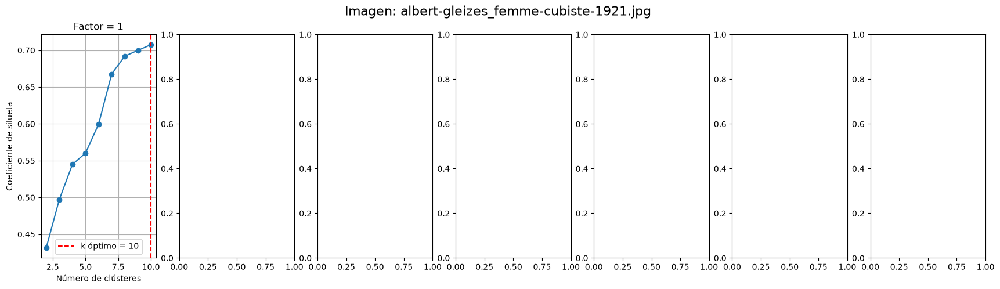

In [15]:
resultados = []

for item in processed_images:

    X = item["image"]
    
    siluetas, k_optimo = silhouette_plot(
    X, 2, 10,
    factor=item["factor"],
    nombre=item["path"].name
    )

    resultados.append({
        "path": item["path"].name,
        "factor": item["factor"],
        "siluetas": siluetas,
        "k_optimo": k_optimo
    })

Tomamos el k_optimo que encontramos con el coeficiente de silueta, ejecutamos K-Means con ese número de clústeres y guardamos los colores representativos de la imagen.

Escogimos k-medias para el desarrollo del proyecto

In [11]:
datos = {(item["path"].name, item["factor"]): item["image"] for item in processed_images}

paletas = []

for r in resultados:
    
    X = datos[(r["path"], r["factor"])]

    item = next(i for i in processed_images
                if i["path"].name == r["path"] and i["factor"] == r["factor"])

    modelo = KMedoids(n_clusters=r["k_optimo"], max_iter=300, n_init=10, random_state=0)
    etiquetas = modelo.fit_predict(X)

    paletas.append({
        "path": r["path"],
        "factor": r["factor"],
        "colores": modelo.cluster_centers_,
        "etiquetas": etiquetas,
        "shape": item["shape"],
        "resized": item["resized"],
        "k_optimo": r["k_optimo"],
        "modelo": modelo
    })

Imagen original → K-Means → cada píxel recibe un clúster → reemplazamos cada píxel por el color de su centroide → imagen segmentada.

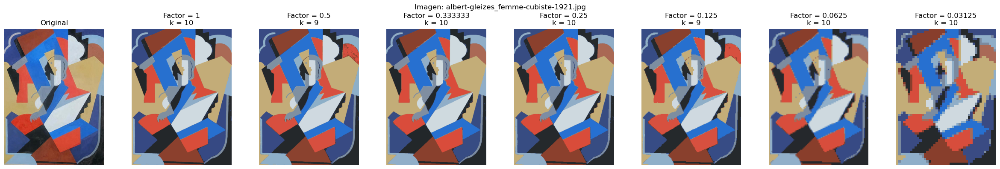

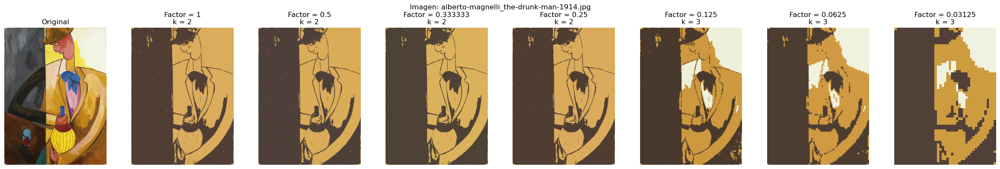

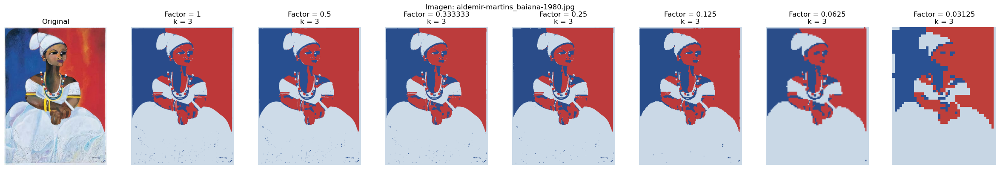

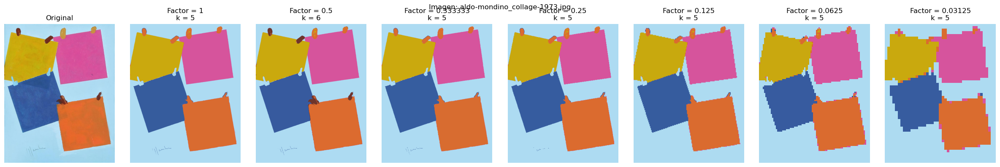

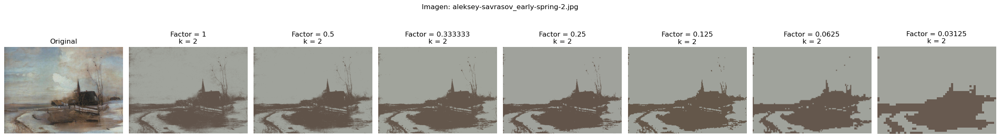

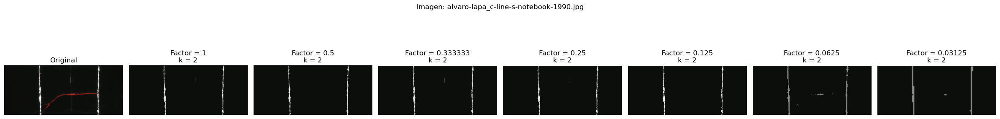

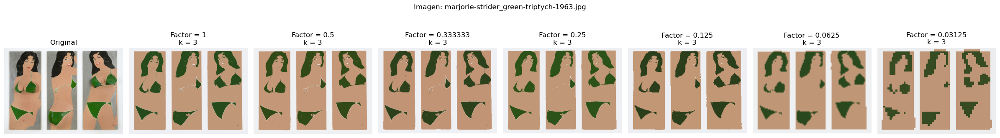

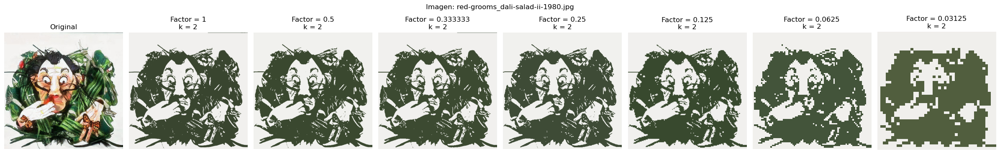

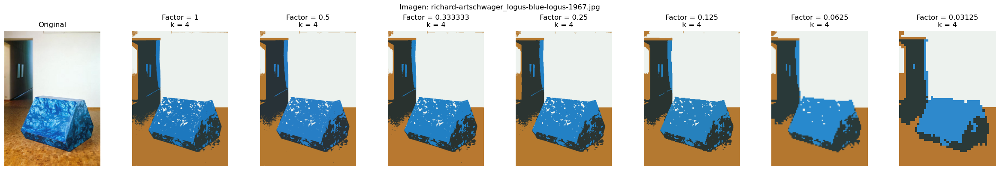

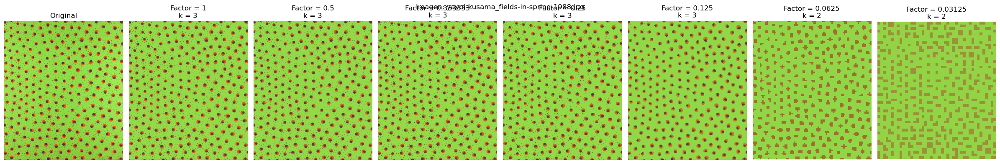

In [12]:
for p in paletas:

    if p["factor"] != 1:
        continue

    plt.figure(figsize=(24, 4))

    nombre = p["path"]

    # Original
    plt.subplot(1, 8, 1)
    plt.imshow(p["resized"])
    plt.title("Original")
    plt.axis("off")

    # 7 factores
    grupo = [q for q in paletas if q["path"] == nombre]
    grupo = sorted(grupo, key=lambda x: x["factor"], reverse=True)

    for i, q in enumerate(grupo):

        centroids = q["colores"]
        labels = q["etiquetas"]

        img_segmentada = (
            centroids[labels] * 255
        ).reshape(q["shape"]).astype(np.uint8)

        plt.subplot(1, 8, i + 2)
        plt.imshow(img_segmentada)
        plt.title(f'Factor = {q["factor"]:g}\nk = {q["k_optimo"]}')
        plt.axis("off")

    plt.suptitle(f"Imagen: {nombre}")
    plt.tight_layout()
    plt.show()

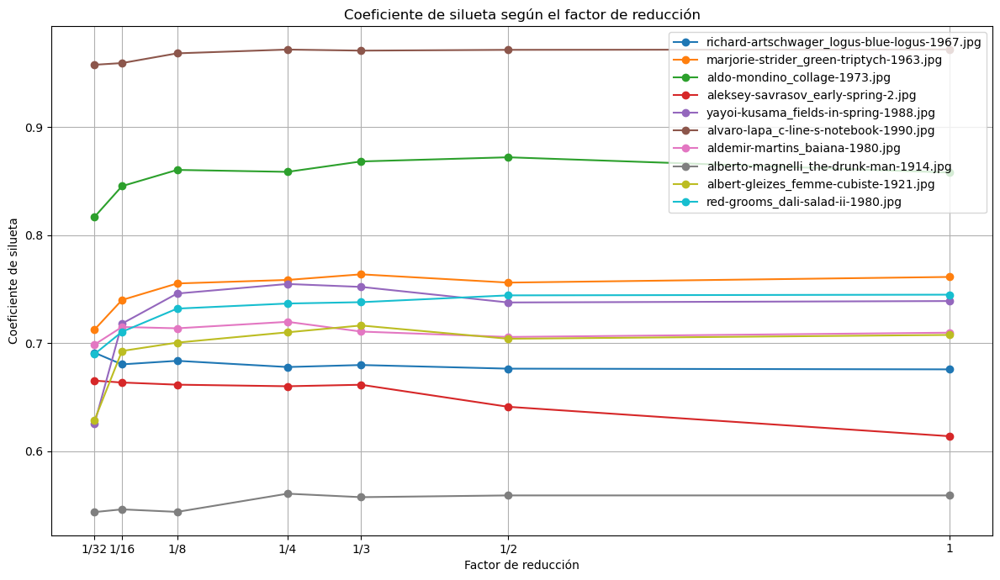

In [13]:
plt.figure(figsize=(12, 7))

for nombre in set(r["path"] for r in resultados):

    datos_imagen = [
        r for r in resultados
        if r["path"] == nombre
    ]

    datos_imagen = sorted(
        datos_imagen,
        key=lambda r: RESIZE_FACTORS.index(r["factor"])
    )

    plt.plot(
        [r["factor"] for r in datos_imagen],
        [max(r["siluetas"]) for r in datos_imagen],
        marker='o',
        label=nombre
    )

plt.xlabel("Factor de reducción")
plt.ylabel("Coeficiente de silueta")
plt.title("Coeficiente de silueta según el factor de reducción")

plt.xticks(
    RESIZE_FACTORS,
    ["1", "1/2", "1/3", "1/4", "1/8", "1/16", "1/32"]
)

plt.grid()
plt.legend()
plt.tight_layout()
plt.show()

Se seleccionó un factor de redimensionamiento de **1/8**, considerando el equilibrio entre la calidad del agrupamiento y la eficiencia computacional. Aunque los factores 1/2, 1/3 y 1/4 presentan en algunos casos coeficientes de silueta ligeramente superiores, las diferencias con respecto a 1/8 son relativamente pequeñas y, en algunas imágenes, incluso se obtiene un coeficiente mayor con este factor. Por otro lado, utilizar 1/8 permite reducir considerablemente la cantidad de píxeles que deben procesarse y, por tanto, los requerimientos computacionales. Los factores inferiores, como 1/16 y 1/32, sí muestran una disminución más evidente del coeficiente de silueta en varias imágenes.

## K-means después de preprocesar las imágenes con el factor de redimensionamiento de 1/8

In [14]:
def silhouette_plot(X, k_min=2, k_max=10, sample_size=5000, random_state=0):
   
    siluetas = []
    n_muestra = min(sample_size, len(X))

    for i in range(k_min, k_max+1):
        model_k = KMedoids(n_clusters=i, max_iter=300, n_init=10, random_state=random_state)
        etiquetas = model_k.fit_predict(X)
        siluetas.append(silhouette_score(X, etiquetas,
                                         sample_size=n_muestra,
                                         random_state=random_state))
    
    k_optimo = range(k_min, k_max+1)[int(np.argmax(siluetas))]

    plt.plot(range(k_min, k_max+1), siluetas, marker='o')
    plt.axvline(k_optimo, color='red', linestyle='--', label=f'k óptimo = {k_optimo}')
    plt.xlabel('Número de clústeres')
    plt.ylabel('Coeficiente de silueta')
    plt.grid()
    plt.legend()
    plt.show()

    return siluetas, k_optimo

Imagen: albert-gleizes_femme-cubiste-1921.jpg | factor: 0.125


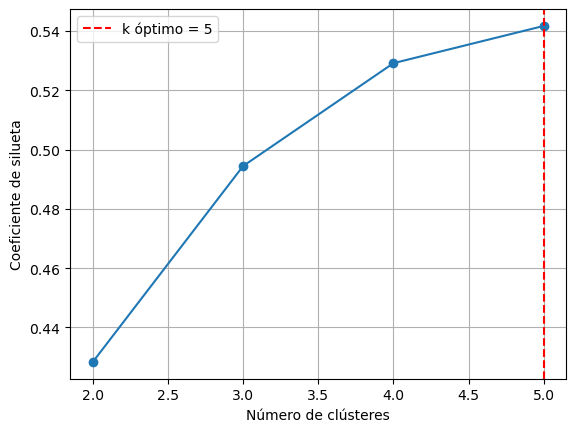

Imagen: alberto-magnelli_the-drunk-man-1914.jpg | factor: 0.125


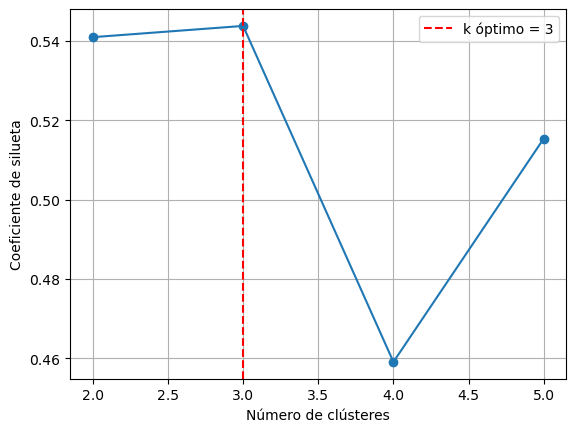

Imagen: aldemir-martins_baiana-1980.jpg | factor: 0.125


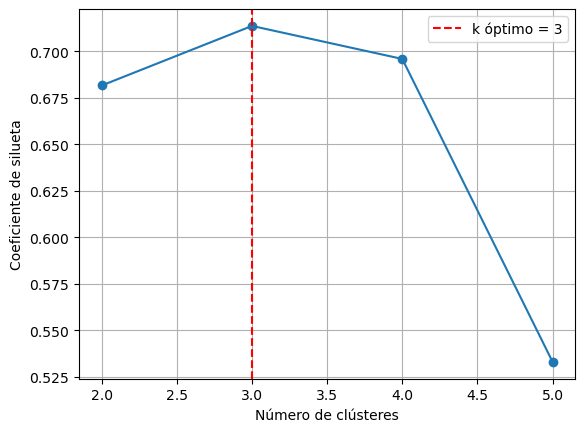

Imagen: aldo-mondino_collage-1973.jpg | factor: 0.125


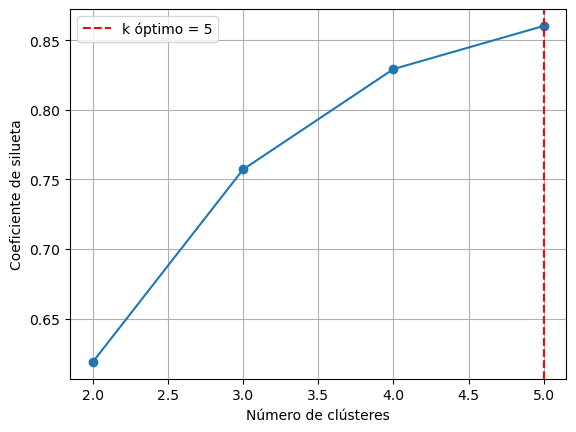

Imagen: aleksey-savrasov_early-spring-2.jpg | factor: 0.125


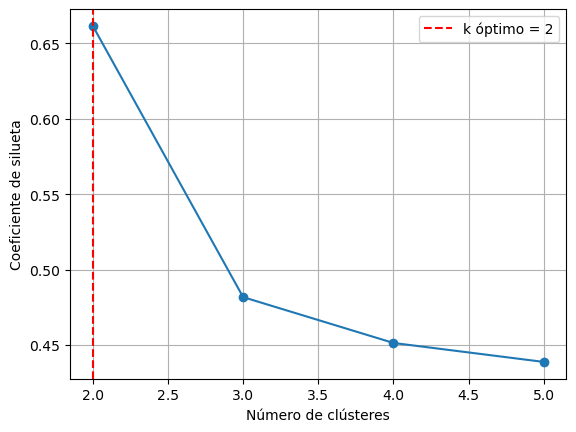

Imagen: alvaro-lapa_c-line-s-notebook-1990.jpg | factor: 0.125


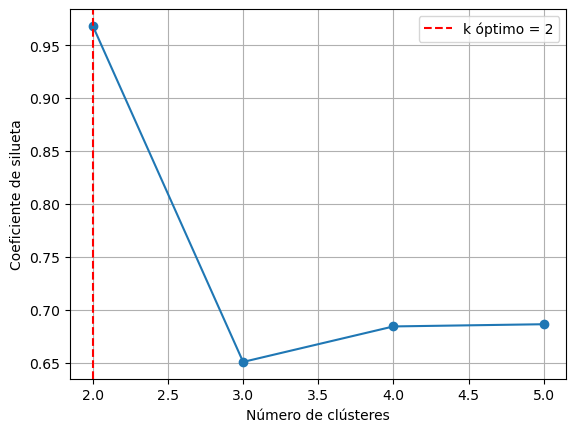

Imagen: marjorie-strider_green-triptych-1963.jpg | factor: 0.125


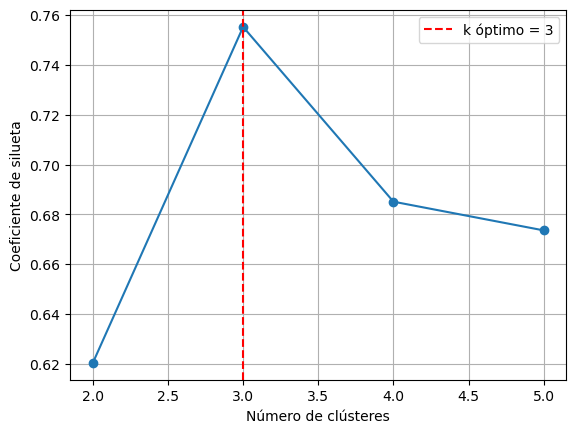

Imagen: red-grooms_dali-salad-ii-1980.jpg | factor: 0.125


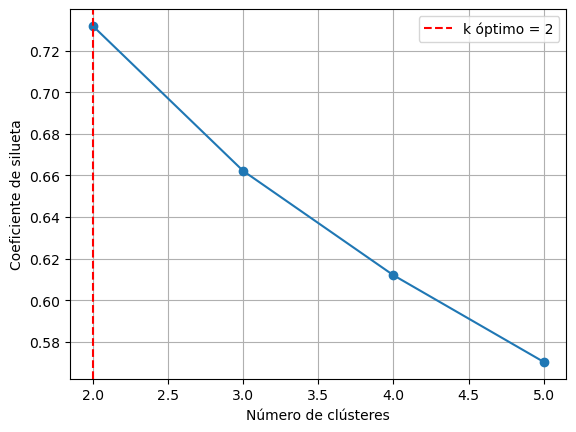

Imagen: richard-artschwager_logus-blue-logus-1967.jpg | factor: 0.125


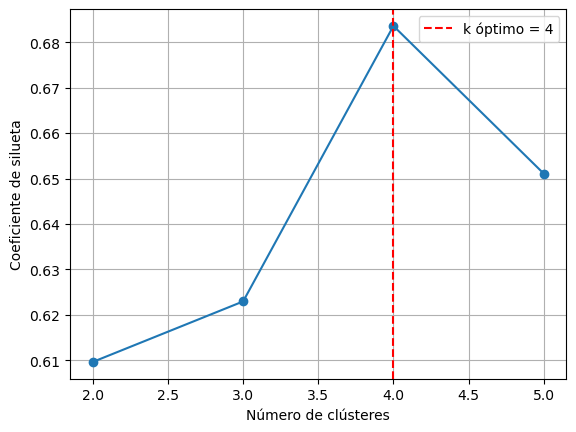

Imagen: yayoi-kusama_fields-in-spring-1988.jpg | factor: 0.125


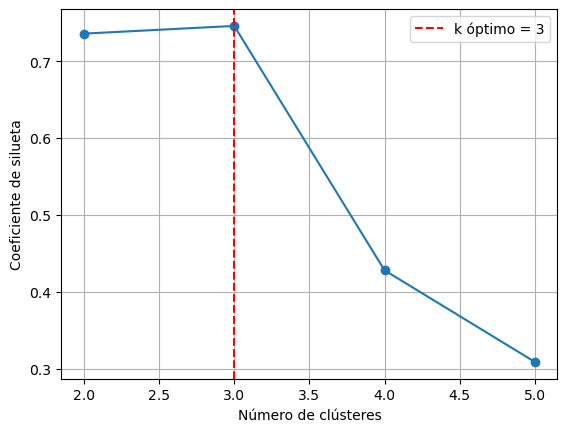

In [15]:
resultados = []

for item in processed_images: ## Procesadas con el pipeline de preprocesamiento inicial
    if item["factor"] != 1/8:## Se eligio este factor despues de probar con varios y notar que la perdida de informacion era minima
        continue

    X = item["image"]

    print(f'Imagen: {item["path"].name} | factor: {item["factor"]}')
    siluetas, k_optimo = silhouette_plot(X, 2, 5)

    resultados.append({
        "path": item["path"].name,
        "factor": item["factor"],
        "siluetas": siluetas,
        "k_optimo": k_optimo
    })

In [16]:
datos = {(item["path"].name, item["factor"]): item["image"] for item in processed_images}

paletas = []

for r in resultados:
    
    X = datos[(r["path"], r["factor"])]

    item = next(i for i in processed_images
                if i["path"].name == r["path"] and i["factor"] == r["factor"])

    modelo = KMedoids(n_clusters=r["k_optimo"], max_iter=300, n_init=10, random_state=0)
    etiquetas = modelo.fit_predict(X)

    paletas.append({
        "path": r["path"],
        "factor": r["factor"],
        "colores": modelo.cluster_centers_,
        "etiquetas": etiquetas,
        "shape": item["shape"],
        "resized": item["resized"],
        "k_optimo": r["k_optimo"],
        "modelo": modelo
    })

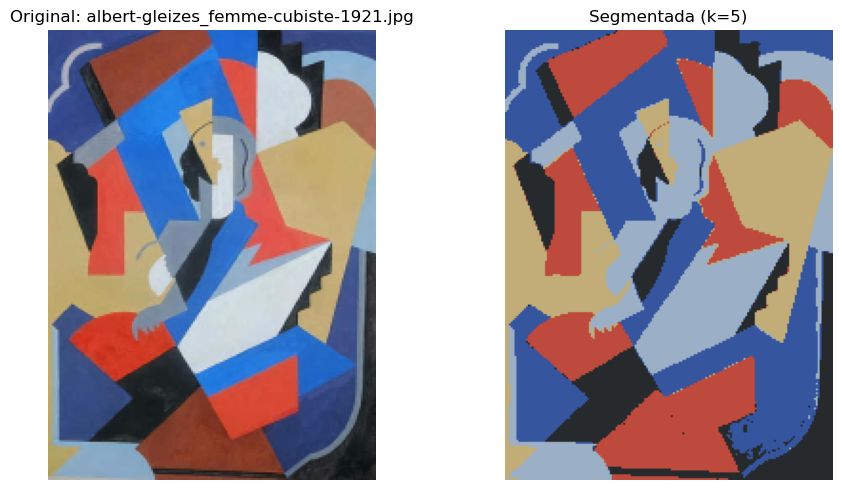

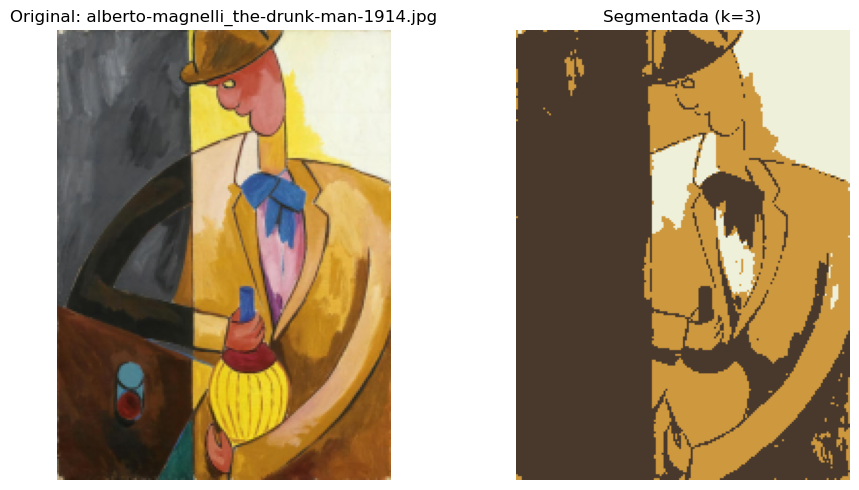

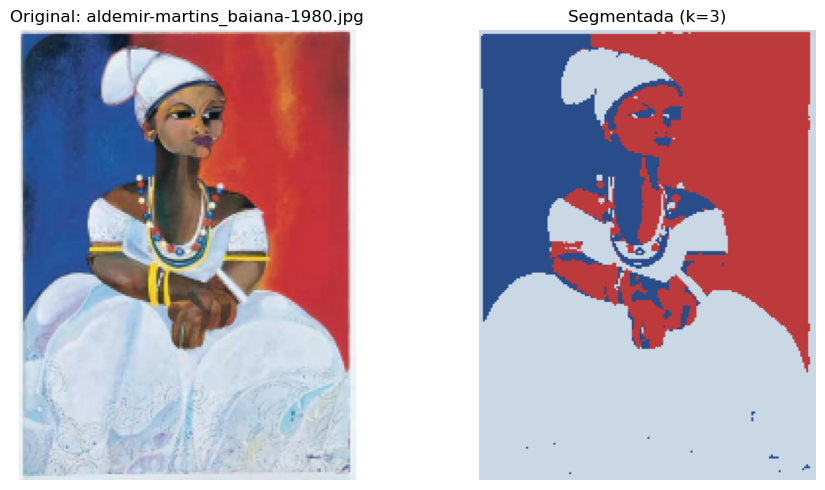

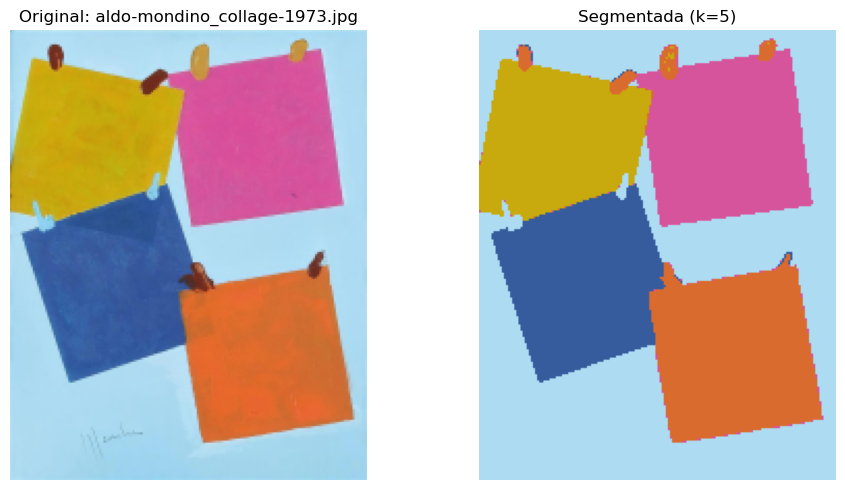

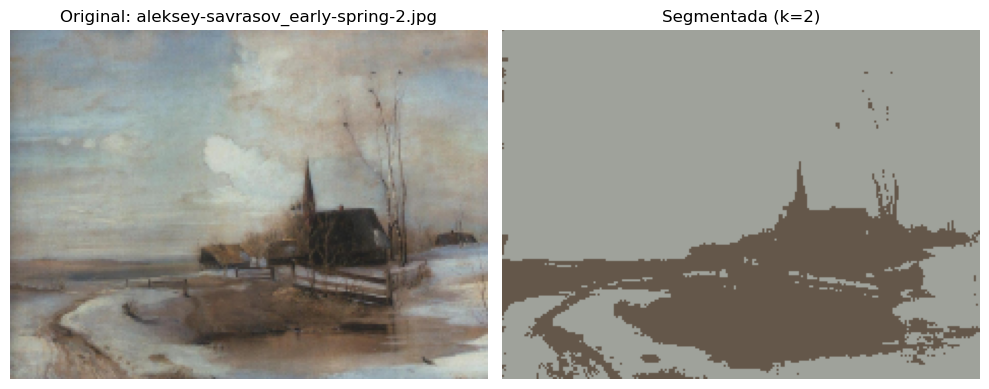

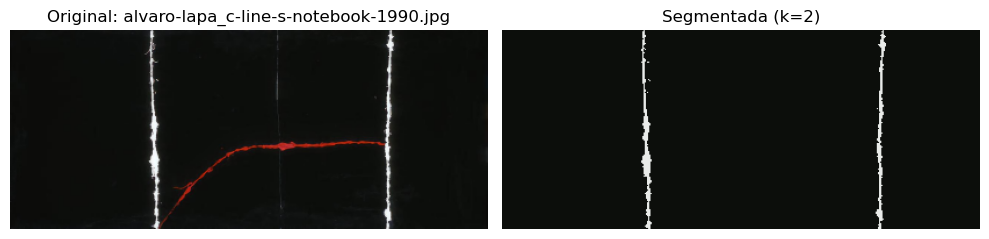

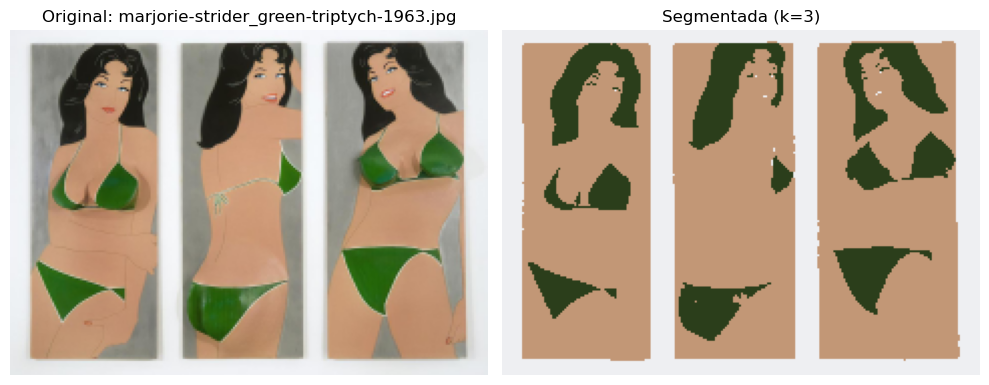

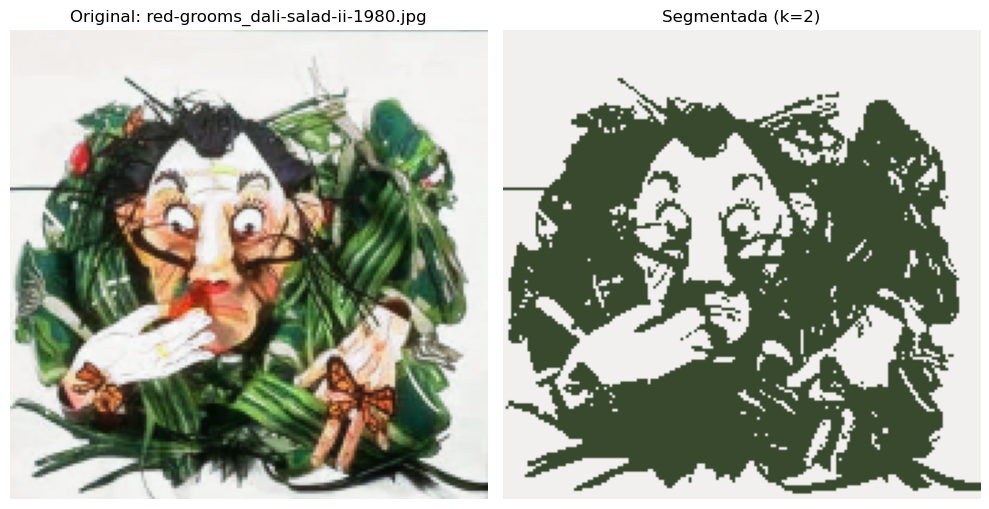

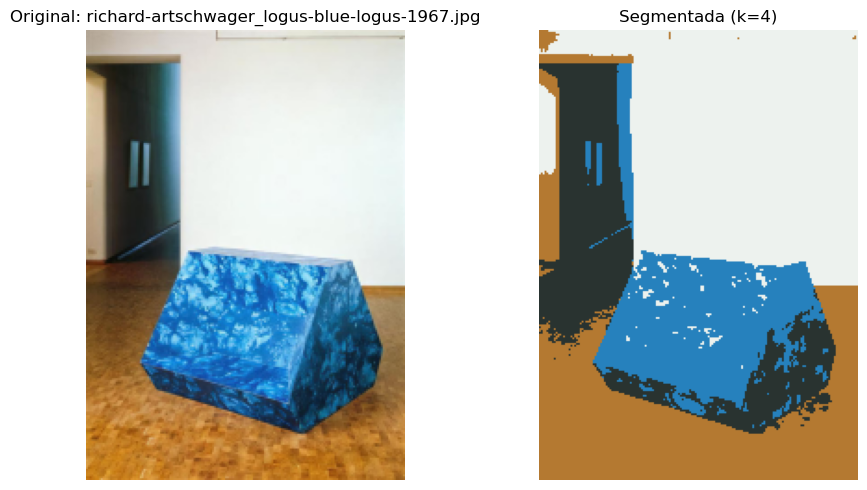

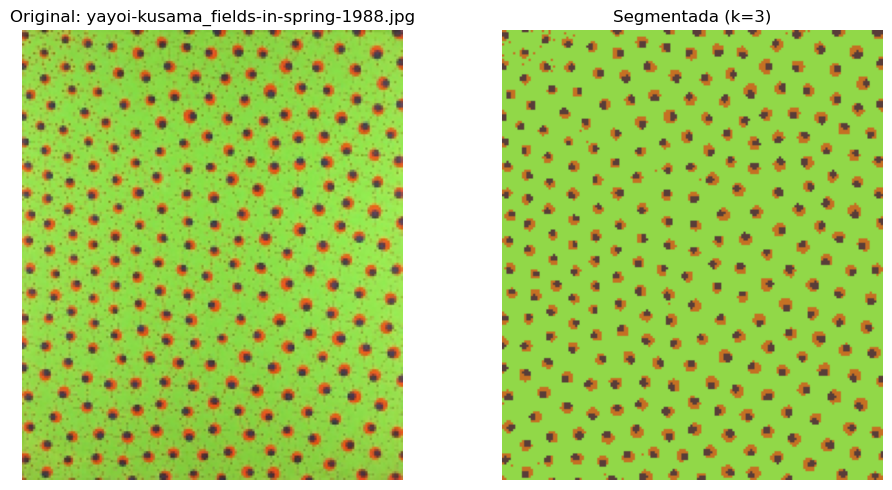

In [17]:
for p in paletas:
    centroids = p["colores"]
    labels = p["etiquetas"]
    target_shape = p["shape"]
    img_original = p["resized"]

    img_segmentada = (centroids[labels] * 255).reshape(target_shape).astype(np.uint8)

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title(f'Original: {p["path"]}')
    plt.imshow(img_original)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title(f'Segmentada (k={p["k_optimo"] if "k_optimo" in p else "?"})')
    plt.imshow(img_segmentada)
    plt.axis('off')

    plt.tight_layout()
    plt.show()

In [18]:
for p in paletas:

    X = datos[(p["path"], p["factor"])]

    tsne = TSNE(
        n_components=2,
        random_state=0,
        perplexity=30
    )

    X_tsne = tsne.fit_transform(X)

In [16]:
plt.figure(figsize=(10, 6))

plt.scatter(
    X_tsne[:, 0],
    X_tsne[:, 1],
    c=etiquetas,
    cmap="viridis",
    s=20
)

plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.title("Visualización de clústeres con t-SNE")
plt.colorbar(label="Clúster")

plt.show()

NameError: name 'X_tsne' is not defined

<Figure size 1000x600 with 0 Axes>

In [19]:
paletas = []

for r in resultados:
    
    X = datos[(r["path"], r["factor"])]

    item = next(i for i in processed_images
                if i["path"].name == r["path"] and i["factor"] == r["factor"])

    modelo = KMedoids(
        n_clusters=r["k_optimo"],
        max_iter=300,
        n_init=10,
        random_state=0
    )

    etiquetas = modelo.fit_predict(X)

    paletas.append({
        "path": r["path"],
        "factor": r["factor"],
        "colores": modelo.cluster_centers_,
        "etiquetas": etiquetas,
        "shape": item["shape"],
        "resized": item["resized"],
        "k_optimo": r["k_optimo"],
        "siluetas": r["siluetas"],   
        "modelo": modelo
    })

Se integran los resultados obtenidos previamente con K-Means para cada imagen y factor de redimensionamiento, recuperando los colores representativos, las etiquetas de los píxeles, el coeficiente de silueta y el k óptimo; posteriormente, se reconstruye la imagen segmentada reemplazando cada píxel por el color representativo de su clúster y se calcula la proporción de píxeles perteneciente a cada color. Finalmente, se genera una visualización de cuatro elementos: la imagen original redimensionada, la curva del coeficiente de silueta para seleccionar el k óptimo, la imagen segmentada mediante K-Means y una paleta de colores que muestra tanto los colores identificados como su proporción dentro de la imagen.

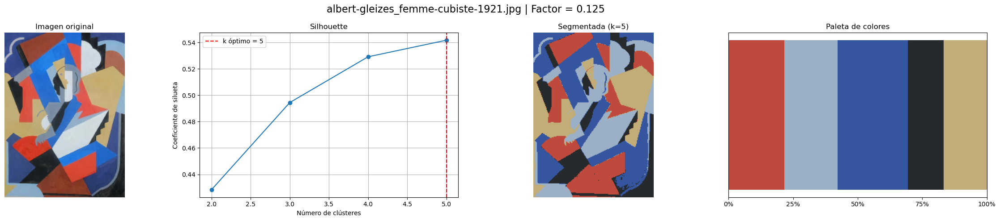

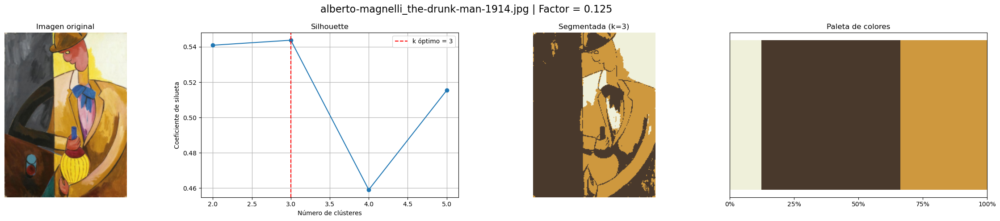

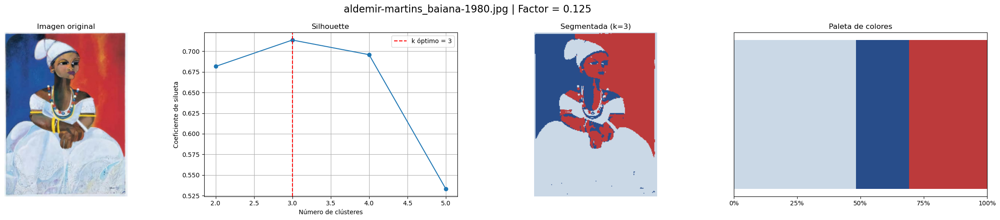

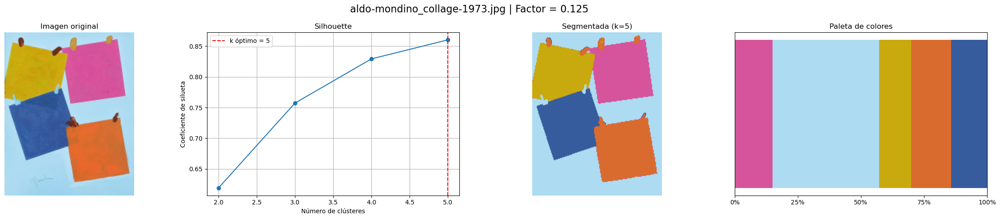

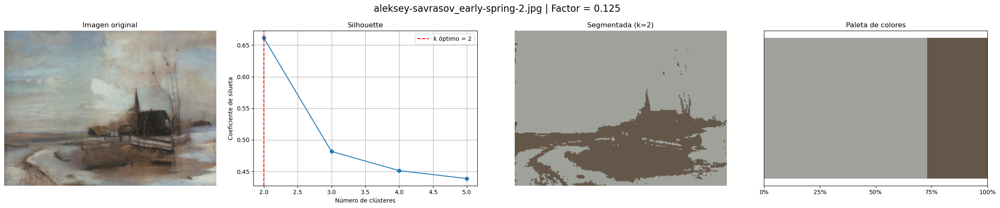

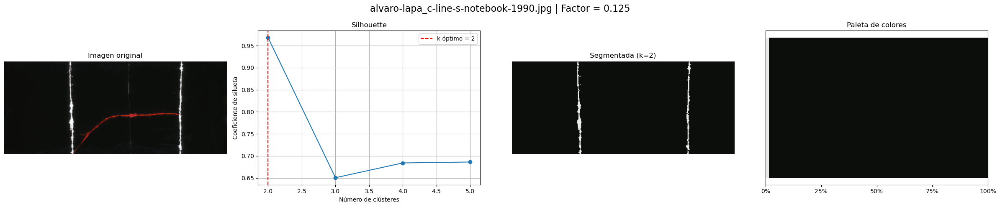

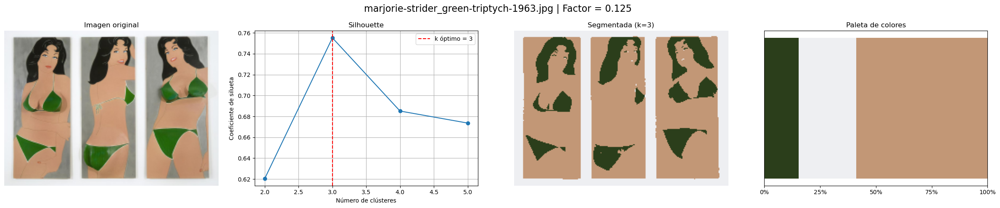

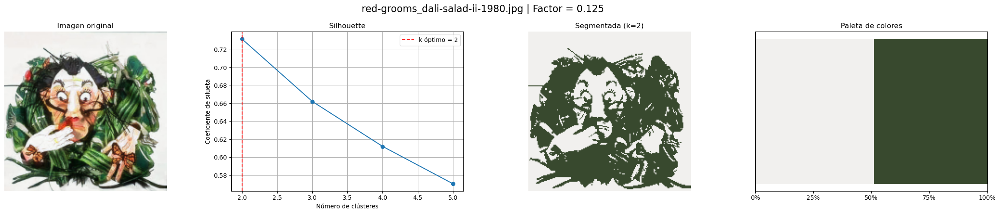

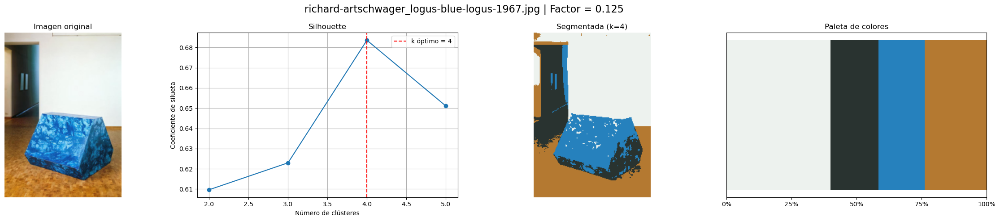

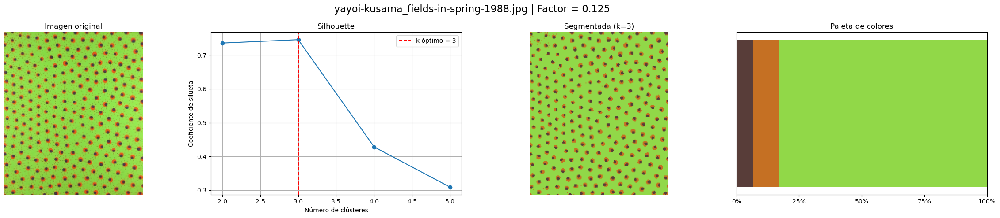

In [20]:
for p in paletas:

    colores = p["colores"]
    etiquetas = p["etiquetas"]
    siluetas = p["siluetas"]
    k_optimo = p["k_optimo"]

    # Imagen segmentada
    img_segmentada = (
        colores[etiquetas] * 255
    ).reshape(p["shape"]).astype(np.uint8)

    # Proporciones
    proporciones = np.bincount(etiquetas) / len(etiquetas)

    # Figura con las 4 partes
    fig, ax = plt.subplots(1, 4, figsize=(24, 5))

    # 1. Original
    ax[0].imshow(p["resized"])
    ax[0].set_title("Imagen original")
    ax[0].axis("off")

    # 2. Silhouette
    ax[1].plot(
        range(2, 2 + len(siluetas)),
        siluetas,
        marker="o"
    )
    ax[1].axvline(
        k_optimo,
        color="red",
        linestyle="--",
        label=f"k óptimo = {k_optimo}"
    )
    ax[1].set_title("Silhouette")
    ax[1].set_xlabel("Número de clústeres")
    ax[1].set_ylabel("Coeficiente de silueta")
    ax[1].grid()
    ax[1].legend()

    # 3. Segmentada
    ax[2].imshow(img_segmentada)
    ax[2].set_title(f"Segmentada (k={k_optimo})")
    ax[2].axis("off")

    # 4. Paleta
    inicio = 0

    for color, proporcion in zip(colores, proporciones):

        ax[3].barh(
            0,
            proporcion,
            left=inicio,
            color=color
        )

        inicio += proporcion

    ax[3].set_xlim(0, 1)
    ax[3].set_yticks([])
    ax[3].set_xticks([0, 0.25, 0.50, 0.75, 1])
    ax[3].set_xticklabels(["0%", "25%", "50%", "75%", "100%"])
    ax[3].set_title("Paleta de colores")

    fig.suptitle(
        f'{p["path"]} | Factor = {p["factor"]}',
        fontsize=16
    )

    plt.tight_layout()
    plt.show()